In [7]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import networkx as nx

from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.decomposition import PCA

from openai import OpenAI
from scipy.special import expit as sigmoid

sns.set(style="whitegrid")


In [ ]:
def load_api():
    api_key = ""

    try:
        client = OpenAI(api_key=api_key)
        return client
    except:
        print("⚠ GPT-4o disabled.")
        return None


In [9]:
df = pd.read_csv("creditcard.csv")
df.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [10]:
def add_temporal(df):
    df = df.sort_values("Time").copy()
    df["iat"] = df["Time"].diff().fillna(0)

    df["iat_mean"] = df["iat"].rolling(40).mean().fillna(0)
    df["iat_std"]  = df["iat"].rolling(40).std().fillna(0)
    df["burst"]    = (df["iat_std"] / (df["iat_mean"]+1e-9)).clip(0,10)
    return df

def add_drift(df):
    df["amount_mean"] = df["Amount"].rolling(80).mean().fillna(df["Amount"].mean())
    df["amount_std"]  = df["Amount"].rolling(80).std().fillna(df["Amount"].std())

    df["mean_shift"] = (df["Amount"] - df["amount_mean"]).abs()
    df["std_shift"]  = (df["Amount"] - df["amount_std"]).abs()
    return df

def add_scaled_amount(df):
    df["amount_z"] = (df["Amount"] - df["Amount"].mean())/(df["Amount"].std()+1e-9)
    return df

df = add_temporal(df)
df = add_drift(df)
df = add_scaled_amount(df)

df.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,Class,iat,iat_mean,iat_std,burst,amount_mean,amount_std,mean_shift,std_shift,amount_z
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0,0.0,0.0,0.0,0.0,88.349619,250.120109,61.270381,100.500109,0.244964
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,0,0.0,0.0,0.0,0.0,88.349619,250.120109,85.659619,247.430109,-0.342474
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0,1.0,0.0,0.0,0.0,88.349619,250.120109,35.150381,126.620109,0.140534
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0,0.0,0.0,0.0,0.0,88.349619,250.120109,290.310381,128.539891,1.160684
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,0,1.0,0.0,0.0,0.0,88.349619,250.120109,84.679619,246.450109,-0.338556


In [11]:
def add_graph(df):
    df = df.copy()
    df["device"] = df["V1"].round().astype(str)+"_"+df["V2"].round().astype(str)

    try:
        df["bucket"] = pd.qcut(df["Amount"], 10, duplicates="drop")
    except:
        df["bucket"] = pd.cut(df["Amount"], 10)

    G = nx.Graph()
    for _, row in df.iterrows():
        G.add_node(row["device"], type="device")
        G.add_node(row["bucket"], type="bucket")
        G.add_edge(row["device"], row["bucket"])

    cent = nx.degree_centrality(G)
    df["centrality"] = df["device"].map(cent).fillna(0)

    comm_map = {}
    for cid, comm in enumerate(nx.community.label_propagation_communities(G)):
        for node in comm:
            comm_map[node] = cid

    df["community"] = df["device"].map(comm_map).fillna(-1).astype(int)
    return df

df = add_graph(df)
df.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,burst,amount_mean,amount_std,mean_shift,std_shift,amount_z,device,bucket,centrality,community
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.0,88.349619,250.120109,61.270381,100.500109,0.244964,-1.0_-0.0,"(100.0, 203.0]",0.015504,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,0.0,88.349619,250.120109,85.659619,247.430109,-0.342474,1.0_0.0,"(1.0, 3.57]",0.015504,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.0,88.349619,250.120109,35.150381,126.620109,0.140534,-1.0_-0.0,"(100.0, 203.0]",0.015504,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.0,88.349619,250.120109,290.310381,128.539891,1.160684,-1.0_-1.0,"(203.0, 25691.16]",0.015504,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,0.0,88.349619,250.120109,84.679619,246.450109,-0.338556,-0.0_1.0,"(3.57, 8.91]",0.015504,0


In [12]:
feature_cols = [
    *[f"V{i}" for i in range(1,29)],
    "Amount","amount_z","iat","burst",
    "mean_shift","std_shift","centrality","community"
]

df_feat = df[feature_cols].fillna(0)


In [13]:
class FraudDetector:
    def __init__(self):
        self.scaler = StandardScaler()
        self.iso = IsolationForest(n_estimators=400, contamination=0.02)
        self.lof = LocalOutlierFactor(n_neighbors=30, novelty=True)
        self.svm = OneClassSVM(kernel="rbf", gamma=0.001, nu=0.02)

    def fit(self, df):
        X = self.scaler.fit_transform(df)
        self.iso.fit(X)
        self.lof.fit(X)
        self.svm.fit(X)

    def score(self, df):
        X = self.scaler.transform(df)

        iso_s = -self.iso.score_samples(X)
        lof_s = -self.lof.score_samples(X)
        svm_s = -self.svm.score_samples(X)

        iso_s = (iso_s - iso_s.min())/(iso_s.max()-iso_s.min()+1e-9)
        lof_s = (lof_s - lof_s.min())/(lof_s.max()-lof_s.min()+1e-9)
        svm_s = (svm_s - svm_s.min())/(svm_s.max()-svm_s.min()+1e-9)

        blended = 0.5*iso_s + 0.3*lof_s + 0.2*svm_s
        return sigmoid(blended)

det = FraudDetector()
det.fit(df_feat)
df["risk"] = det.score(df_feat)


In [15]:
def tune_threshold(df):
    t_list = np.linspace(0.65, 0.95, 30)
    recalls = []

    for t in t_list:
        flagged = df["risk"] >= t
        hit = df[flagged]["Class"].sum()
        recalls.append(hit)

    best = t_list[np.argmax(recalls)]
    return best

threshold = tune_threshold(df)
threshold


np.float64(0.65)

In [16]:
df["flag"] = df["risk"] >= threshold
df["flag"].sum(), df["Class"].sum()


(np.int64(107), np.int64(492))

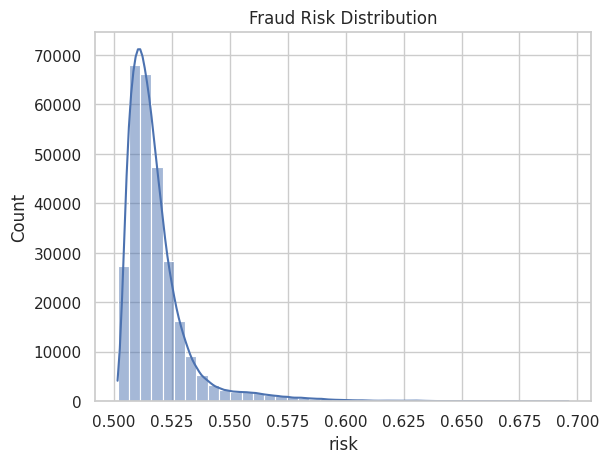

In [17]:
sns.histplot(df["risk"], bins=40, kde=True)
plt.title("Fraud Risk Distribution")
plt.show()


In [18]:
p = PCA(n_components=2).fit_transform(df_feat)
df["pc1"], df["pc2"] = p[:,0], p[:,1]
px.scatter(df, x="pc1", y="pc2", color="risk", color_continuous_scale="inferno")


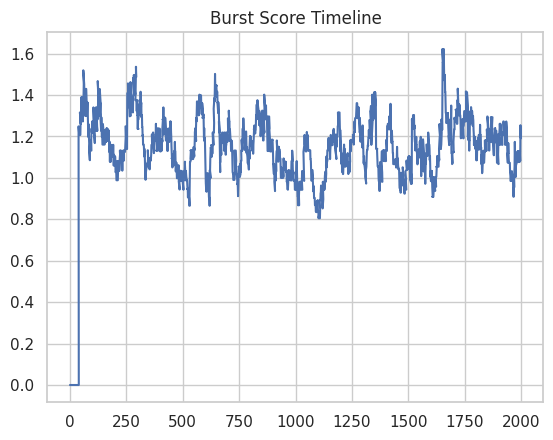

In [20]:
plt.plot(df["burst"].head(2000))
plt.title("Burst Score Timeline")
plt.show()


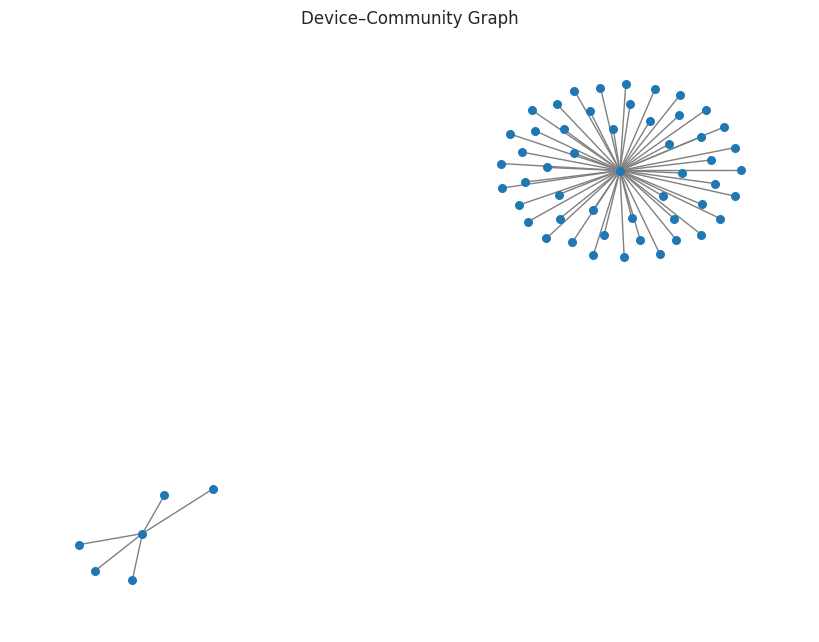

In [21]:
sub = df.sample(300)
G = nx.from_pandas_edgelist(sub, "device", "community")

plt.figure(figsize=(8,6))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, node_size=30, edge_color="gray")
plt.title("Device–Community Graph")
plt.show()


In [22]:
client = load_api()

top = df[df["flag"]].nlargest(20, "risk")

prompt = f"""
Generate a detailed AML case narrative analyzing:
- behavioral drift
- temporal iat anomalies
- layering / structuring patterns
- device community patterns
- burst spikes

Transactions:
{top[['Time','Amount','community','burst','risk']].to_string(index=False)}
"""

if client:
    out = client.chat.completions.create(
        model="gpt-4o",
        messages=[{"role":"user","content":prompt}]
    )
    print(out.choices[0].message.content)
else:
    print("GPT-4o disabled.")


## Anti-Money Laundering (AML) Case Narrative

### Overview
This case narrative examines potential money laundering activities characterized by various patterns observed in a dataset of financial transactions. Key areas of analysis include behavioral drift, temporal iat anomalies, layering and structuring patterns, device community patterns, and burst spikes.

### Transaction Analysis

#### Behavioral Drift
Behavioral drift refers to deviations from expected transaction patterns. This can include unusual transaction sizes or frequencies for a specific account or across related accounts. In this dataset, several transactions exhibit high amounts inconsistent with others in terms of value and occurrence frequency. The first two transactions, with amounts of $25,691.16 and $19,656.53 at times 166198.0 and 48401.0 respectively, appear to be outliers within the dataset indicating possible behavioral drift. These transactions are significantly higher than the median transaction amount and ma